In [1]:
import tensorflow as tf

load_img = tf.keras.preprocessing.image.load_img
img_to_array = tf.keras.preprocessing.image.img_to_array
array_to_img = tf.keras.preprocessing.image.array_to_img
Adam = tf.keras.optimizers.Adam
fashion_mnist = tf.keras.datasets.fashion_mnist
to_categorical = tf.keras.utils.to_categorical
ImageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator
ModelCheckpoint = tf.keras.callbacks.ModelCheckpoint
load_model = tf.keras.models.load_model

from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

import plotly.graph_objs as go
from plotly import subplots
import plotly

from PIL import Image

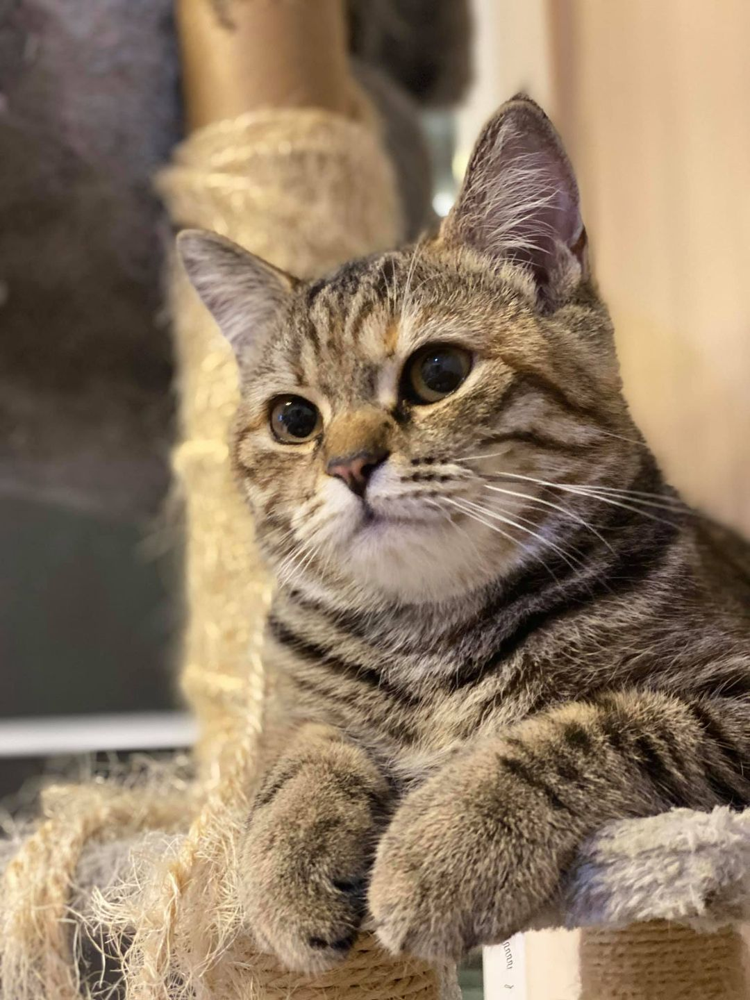

In [3]:
cat = load_img('cat.jpg')
cat

In [4]:
cat = img_to_array(cat)
print(cat.shape)

(1440, 1080, 3)


In [5]:
input_shape = cat.shape

# Define the input layer using the functional API
inputs = tf.keras.Input(shape=input_shape)

x = tf.keras.layers.Conv2D(3,          # number of filter layers
                          (3,          # y dimension of kernel
                           3))(inputs) # x dimension of kernel

model = tf.keras.Model(inputs=inputs, outputs=x)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 1440, 1080, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 1438, 1078, 3)  │            84 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 84 (336.00 B)

 Trainable params: 84 (336.00 B)

 Non-trainable params: 0 (0.00 B)

In [6]:
cat_batch = np.expand_dims(cat,axis=0)
cat_batch.shape

(1, 1440, 1080, 3)

In [7]:
conv_cat = model(cat_batch)
conv_cat.shape

TensorShape([1, 1438, 1078, 3])

In [8]:
conv_cat = np.squeeze(conv_cat, axis=0)
conv_cat.shape

(1438, 1078, 3)

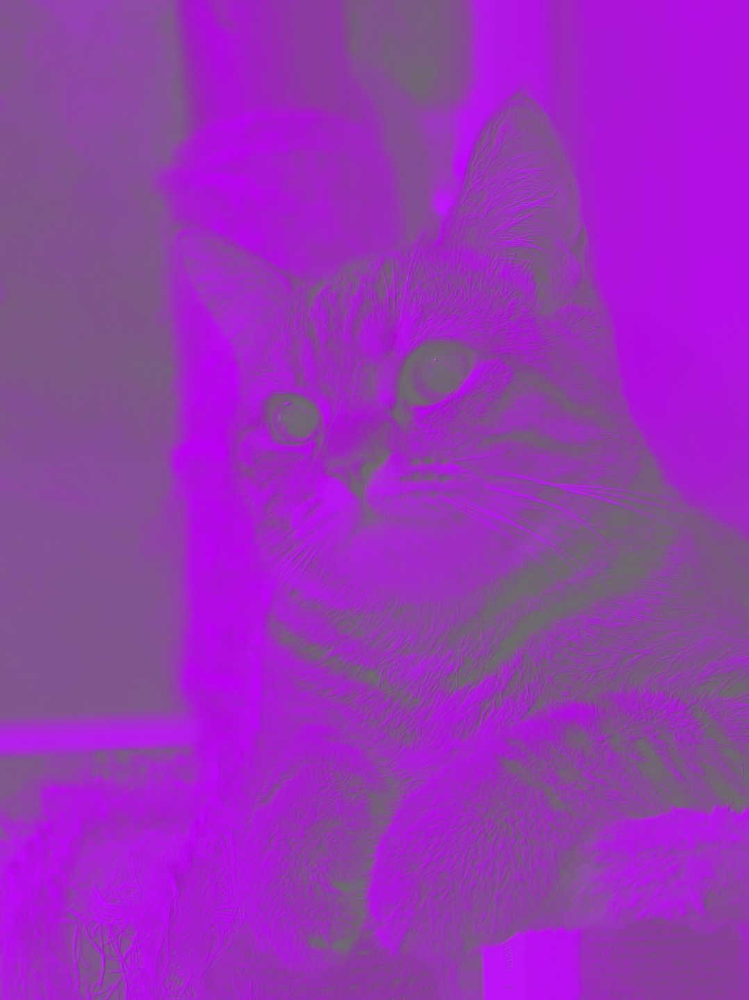

In [9]:
conv_cat = array_to_img(conv_cat)
display(conv_cat)

In [10]:
def visualize_cat(model, cat):
    cat_batch = np.expand_dims(cat,axis=0)
    conv_cat = model(cat_batch)
    conv_cat = np.squeeze(conv_cat, axis=0)
    conv_cat = array_to_img(conv_cat)
    display(conv_cat)

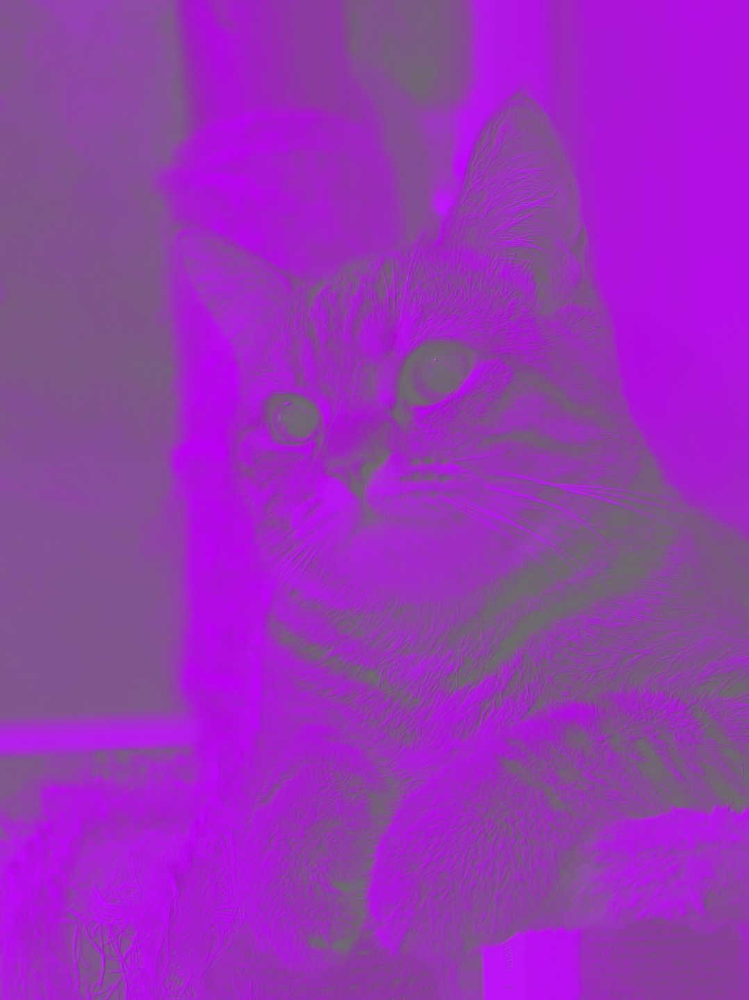

In [11]:
visualize_cat(model, cat)

In [12]:
input_shape = cat.shape

inputs = tf.keras.Input(shape=input_shape)

x = tf.keras.layers.Conv2D(3, (10, 10))(inputs)

model = tf.keras.Model(inputs=inputs, outputs=x)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 1440, 1080, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 1431, 1071, 3)  │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 903 (3.53 KB)

 Trainable params: 903 (3.53 KB)

 Non-trainable params: 0 (0.00 B)

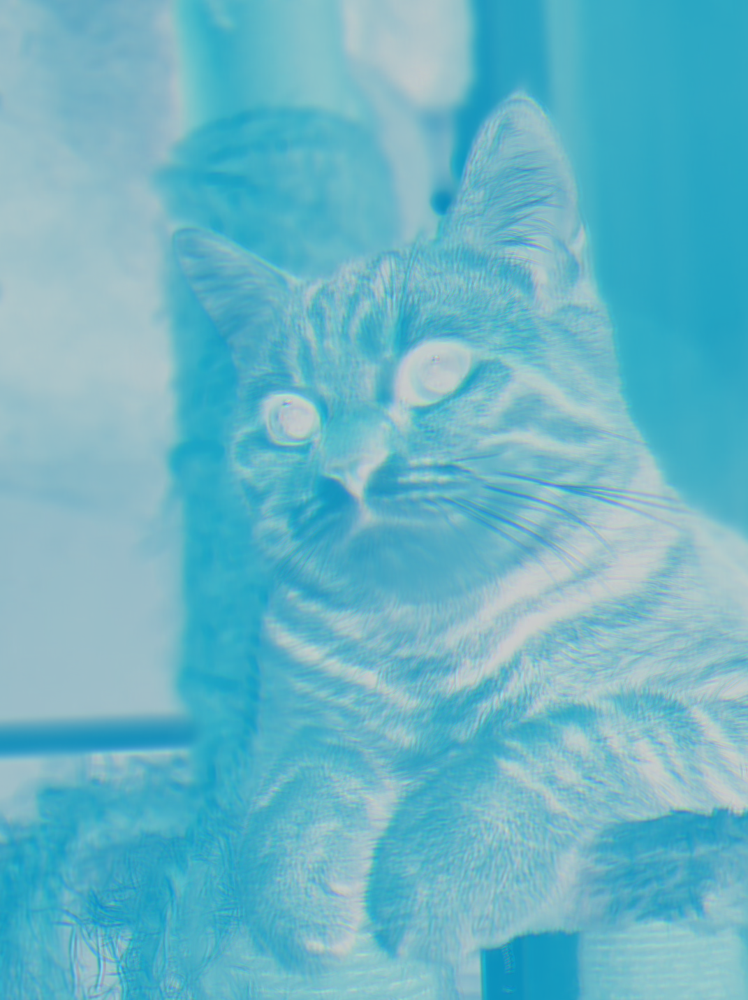

In [13]:
visualize_cat(model, cat)

In [14]:
input_shape = cat.shape

inputs = tf.keras.Input(shape=input_shape)
x = tf.keras.layers.Conv2D(1,(3,3))(inputs)
model = tf.keras.Model(inputs=inputs, outputs=x)

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 1440, 1080, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 1438, 1078, 1)  │            28 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28 (112.00 B)

 Trainable params: 28 (112.00 B)

 Non-trainable params: 0 (0.00 B)

In [15]:
def visualize_cat_one_channel(model, cat):
    cat_batch = np.expand_dims(cat,axis=0)
    conv_cat2 = model(cat_batch)
    conv_cat2 = np.squeeze(conv_cat2, axis=0)
    conv_cat2 = array_to_img(conv_cat2)
    display(conv_cat2)

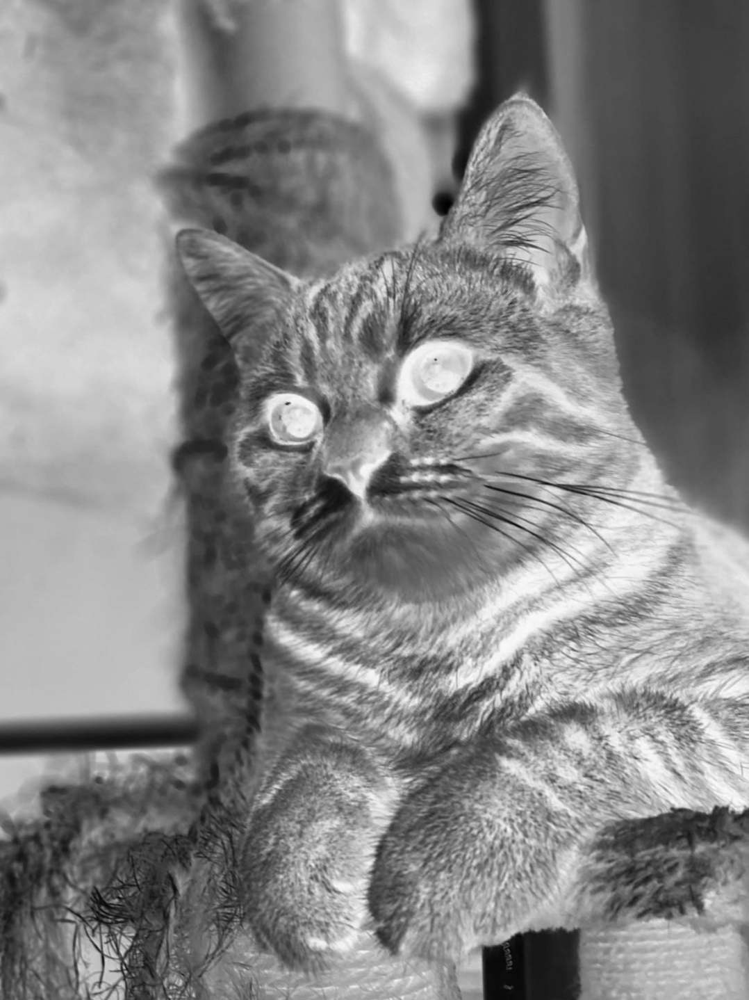

In [16]:
visualize_cat_one_channel(model, cat)

In [17]:
input_shape = cat.shape

inputs = tf.keras.Input(shape=input_shape)
x = tf.keras.layers.Conv2D(1,(20,20))(inputs)
model = tf.keras.Model(inputs=inputs, outputs=x)

model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 1440, 1080, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 1421, 1061, 1)  │         1,201 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,201 (4.69 KB)

 Trainable params: 1,201 (4.69 KB)

 Non-trainable params: 0 (0.00 B)

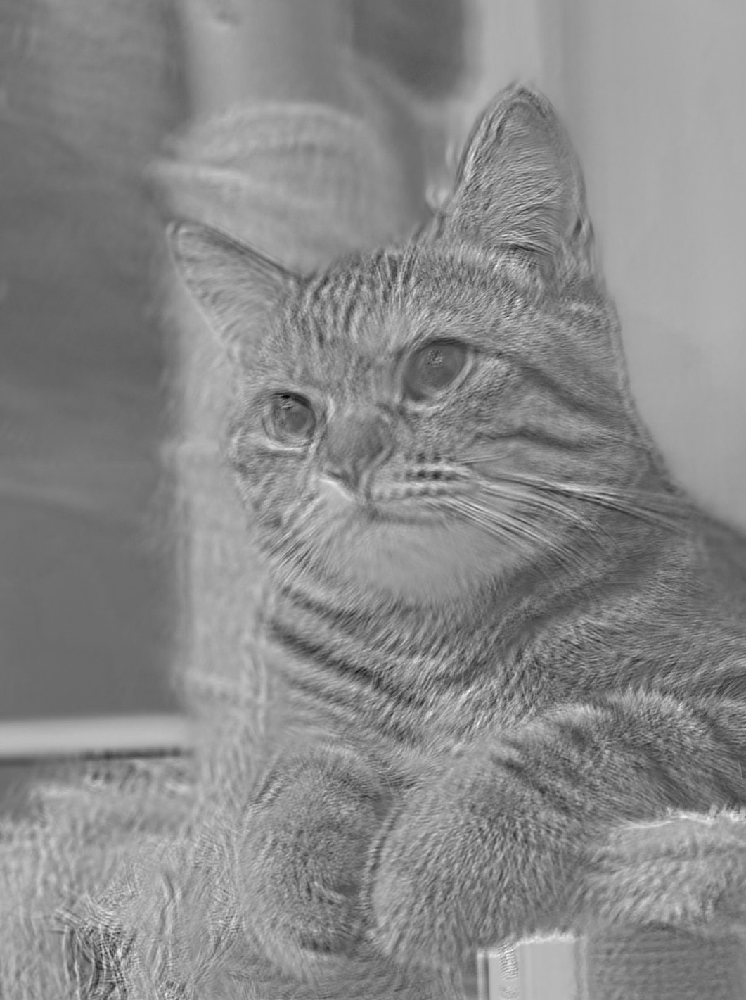

In [18]:
visualize_cat_one_channel(model, cat)

In [19]:
input_shape = cat.shape

inputs = tf.keras.Input(shape=input_shape)

x = tf.keras.layers.Conv2D(1,(20,20))(inputs)
x = tf.keras.layers.Activation('relu')(x)
model = tf.keras.Model(inputs=inputs, outputs=x)

model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 1440, 1080, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 1421, 1061, 1)  │         1,201 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 1421, 1061, 1)  │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,201 (4.69 KB)

 Trainable params: 1,201 (4.69 KB)

 Non-trainable params: 0 (0.00 B)

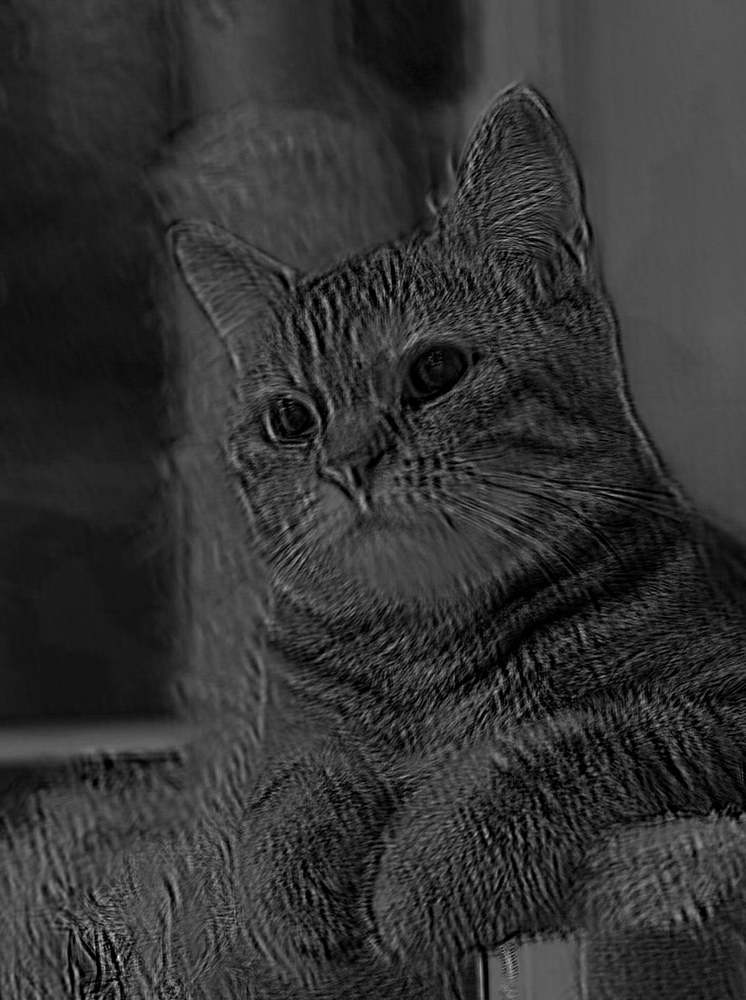

In [20]:
visualize_cat_one_channel(model, cat)

In [21]:
input_shape = cat.shape

inputs = tf.keras.Input(shape=input_shape)

x = tf.keras.layers.Conv2D(1,(3,3))(inputs)
x = tf.keras.layers.MaxPooling2D(pool_size=(5,5))(x)

model = tf.keras.Model(inputs=inputs, outputs=x)

model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 1440, 1080, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 1438, 1078, 1)  │            28 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 287, 215, 1)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28 (112.00 B)

 Trainable params: 28 (112.00 B)

 Non-trainable params: 0 (0.00 B)

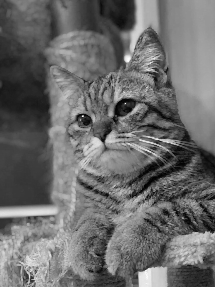

In [22]:
visualize_cat_one_channel(model, cat)

In [24]:
input_shape = cat.shape

inputs = tf.keras.Input(shape=input_shape)

x = tf.keras.layers.Conv2D(1,(3,3))(inputs)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(5,5))(x)

model = tf.keras.Model(inputs=inputs, outputs=x)

model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 1440, 1080, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 1438, 1078, 1)  │            28 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 1438, 1078, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 287, 215, 1)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28 (112.00 B)

 Trainable params: 28 (112.00 B)

 Non-trainable params: 0 (0.00 B)

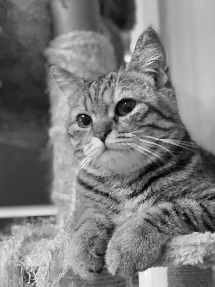

In [25]:
visualize_cat_one_channel(model, cat)

In [26]:
input_shape = cat.shape

inputs = tf.keras.Input(shape=input_shape)

# Add layers
x = tf.keras.layers.Conv2D(1,(3,3))(inputs)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(3,3))(x)

x = tf.keras.layers.Conv2D(1,(3,3))(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D(pool_size=(3,3))(x)

# Create the model
model = tf.keras.Model(inputs=inputs, outputs=x)

model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 1440, 1080, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 1438, 1078, 1)  │            28 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 1438, 1078, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 479, 359, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 477, 357, 1)    │            10 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 477, 357, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 159, 119, 1)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 38 (152.00 B)

 Trainable params: 38 (152.00 B)

 Non-trainable params: 0 (0.00 B)

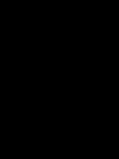

In [27]:
visualize_cat_one_channel(model, cat)

In [28]:
IMG_ROWS = 28
IMG_COLS = 28
NUM_CLASSES = 10
VAL_SIZE = 0.2
RANDOM_STATE = 99

BATCH_SIZE = 128

In [29]:
(train_data, y), (test_data, y_test) = fashion_mnist.load_data()

print("Fashion MNIST train -  rows:",train_data.shape[0]," columns:", train_data.shape[1], " rows:", train_data.shape[2])
print("Fashion MNIST test -  rows:",test_data.shape[0]," columns:", test_data.shape[1], " rows:", train_data.shape[2])

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Fashion MNIST train -  rows: 60000  columns: 28  rows: 28
Fashion MNIST test -  rows: 10000  columns: 28  rows: 28


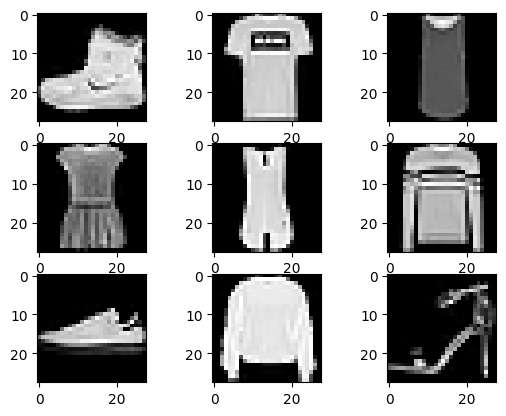

In [30]:
for i in range(9):
    plt.subplot(330 + 1 + i)
    plt.imshow(train_data[i], cmap=plt.get_cmap('gray'))

plt.savefig('fashion_mnist.jpeg', dpi=300)

In [31]:
print(train_data.shape, test_data.shape)

train_data = train_data.reshape((train_data.shape[0], 28, 28, 1))
test_data = test_data.reshape((test_data.shape[0], 28, 28, 1))

print(train_data.shape, test_data.shape)

(60000, 28, 28) (10000, 28, 28)
(60000, 28, 28, 1) (10000, 28, 28, 1)


In [32]:
train_data = train_data / 255.0
test_data = test_data / 255.0

In [33]:
y = to_categorical(y)
y_test = to_categorical(y_test)

print(y.shape, y_test.shape)
y[:10]

(60000, 10) (10000, 10)


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]])

In [34]:
x_train, x_val, y_train, y_val = train_test_split(train_data, y, test_size=VAL_SIZE, random_state=RANDOM_STATE)

x_train.shape, x_val.shape, y_train.shape, y_val.shape

((48000, 28, 28, 1), (12000, 28, 28, 1), (48000, 10), (12000, 10))

In [35]:
def create_trace(x,y,ylabel,color):
        trace = go.Scatter(
            x = x,y = y,
            name=ylabel,
            marker=dict(color=color),
            mode = "markers+lines",
            text=x
        )
        return trace

def plot_accuracy_and_loss(train_model):
    hist = train_model.history
    acc = hist['accuracy']
    val_acc = hist['val_accuracy']
    loss = hist['loss']
    val_loss = hist['val_loss']
    epochs = list(range(1,len(acc)+1))

    trace_ta = create_trace(epochs,acc,"Training accuracy", "Green")
    trace_va = create_trace(epochs,val_acc,"Validation accuracy", "Red")
    trace_tl = create_trace(epochs,loss,"Training loss", "Blue")
    trace_vl = create_trace(epochs,val_loss,"Validation loss", "Magenta")
    fig = subplots.make_subplots(rows=1,cols=2, subplot_titles=('Training and validation accuracy',
                                                             'Training and validation loss'))
    fig.append_trace(trace_ta,1,1)
    fig.append_trace(trace_va,1,1)
    fig.append_trace(trace_tl,1,2)
    fig.append_trace(trace_vl,1,2)
    fig['layout']['xaxis'].update(title = 'Epoch')
    fig['layout']['xaxis2'].update(title = 'Epoch')
    fig['layout']['yaxis'].update(title = 'Accuracy', range=[0,1])
    fig['layout']['yaxis2'].update(title = 'Loss', range=[0,1])

    plotly.offline.iplot(fig, filename='accuracy-loss')

In [36]:
datagen = ImageDataGenerator(
        rotation_range=0.05,    #Randomly rotate images in the range
        zoom_range = 0.2,       # Randomly zoom image
        width_shift_range=0.1,  #Randomly shift images horizontally
        height_shift_range=0.1, #Randomly shift images vertically
        shear_range=0.05        #Randomly shear images
)

datagen.fit(x_train)

In [37]:
input_shape = (28, 28, 1)

inputs = tf.keras.Input(shape=input_shape)

#1. CNN LAYER
x = tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', name = 'conv2d1')(inputs)
x = tf.keras.layers.BatchNormalization(name = 'batch_norm1')(x)
x = tf.keras.layers.Activation("relu", name = 'relu1')(x)
x = tf.keras.layers.Dropout(0.3, name = 'dropout1')(x)

#2. CNN LAYER
x = tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', name = 'conv2d2')(x)
x = tf.keras.layers.BatchNormalization(name = 'batch_norm2')(x)
x = tf.keras.layers.Activation("relu", name = 'relu2')(x)

x = tf.keras.layers.MaxPool2D(pool_size=(2, 2), name = 'maxpool2d1')(x)
x = tf.keras.layers.Dropout(0.3, name = 'dropout2')(x)

#3. CNN LAYER
x = tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', name = 'conv2d3')(x)
x = tf.keras.layers.BatchNormalization(name = 'batch_norm3')(x)
x = tf.keras.layers.Activation("relu", name = 'relu3')(x)
x = tf.keras.layers.Dropout(0.3, name = 'dropout3')(x)

#4. CNN LAYER
x = tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', name = 'conv2d4')(x)
x = tf.keras.layers.BatchNormalization(name = 'batch_norm4')(x)
x = tf.keras.layers.Activation("relu", name = 'relu4')(x)

x = tf.keras.layers.MaxPool2D(pool_size=(2, 2), name = 'maxpool2d2')(x)
x = tf.keras.layers.Dropout(0.3, name = 'dropout4')(x)


#FULLY CONNECTED LAYER
x = tf.keras.layers.Flatten(name = 'flatten1')(x)
x = tf.keras.layers.Dense(256, name = 'dense1')(x)
x = tf.keras.layers.BatchNormalization(name = 'batch_norm5')(x)
x = tf.keras.layers.Activation("relu", name = 'relu5')(x)
x = tf.keras.layers.Dropout(0.30, name = 'dropout5')(x)

#OUTPUT LAYER
outputs = tf.keras.layers.Dense(10, activation='softmax', name = 'dense2')(x)

# Create the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [38]:
optimizer = Adam()
model.compile(optimizer = optimizer, loss = "categorical_crossentropy", metrics=["accuracy"])

In [39]:
filepath="weights.best.keras"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [checkpoint]

In [41]:
NO_EPOCHS = 10
history = model.fit(datagen.flow(x_train, y_train, batch_size=BATCH_SIZE),
                              shuffle=True,
                              epochs=NO_EPOCHS, validation_data = (x_val, y_val),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // BATCH_SIZE,
                              callbacks=callbacks_list)

Epoch 1/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 637ms/step - accuracy: 0.6335 - loss: 0.9927
Epoch 1: val_loss improved from inf to 2.49737, saving model to weights.best.keras
375/375 ━━━━━━━━━━━━━━━━━━━━ 252s 670ms/step - accuracy: 0.6337 - loss: 0.9921 - val_accuracy: 0.2161 - val_loss: 2.4974
Epoch 2/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 635ms/step - accuracy: 0.7755 - loss: 0.5811
Epoch 2: val_loss improved from 2.49737 to 0.44475, saving model to weights.best.keras
375/375 ━━━━━━━━━━━━━━━━━━━━ 260s 666ms/step - accuracy: 0.7755 - loss: 0.5811 - val_accuracy: 0.8330 - val_loss: 0.4447
Epoch 3/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 624ms/step - accuracy: 0.8104 - loss: 0.5001
Epoch 3: val_loss improved from 0.44475 to 0.33238, saving model to weights.best.keras
375/375 ━━━━━━━━━━━━━━━━━━━━ 267s 679ms/step - accuracy: 0.8105 - loss: 0.5001 - val_accuracy: 0.8745 - val_loss: 0.3324
Epoch 4/10
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 631ms/step - accuracy: 0.8328 - loss: 0.4477
Epoch 4: val_loss did not im

In [42]:
plot_accuracy_and_loss(history)

In [43]:
predict_model = load_model(filepath)

In [44]:
score = predict_model.evaluate(test_data, y_test,verbose=0)
print("Test Loss:",score[0])
print("Test Accuracy:",score[1])

Test Loss: 0.2452142834663391
Test Accuracy: 0.9093999862670898


In [45]:
predict_model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d1 (Conv2D)                │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm1                     │ (None, 28, 28, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1 (Activation)              │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout1 (Dropout)              │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d2 (Conv2D)                │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm2                     │ (None, 28, 28, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu2 (Activation)              │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool2d1 (MaxPooling2D)       │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout2 (Dropout)              │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d3 (Conv2D)                │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm3                     │ (None, 14, 14, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu3 (Activation)              │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout3 (Dropout)              │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d4 (Conv2D)                │ (None, 14, 14, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm4                     │ (None, 14, 14, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu4 (Activation)              │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool2d2 (MaxPooling2D)       │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout4 (Dropout)              │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten1 (Flatten)              │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ (None, 256)            │       803,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm5                     │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,615,488 (9.98 MB)

 Trainable params: 871,530 (3.32 MB)

 Non-trainable params: 896 (3.50 KB)

 Optimizer params: 1,743,062 (6.65 MB)

In [46]:
kernel_bias = []
for layer in predict_model.layers:
    if 'conv' not in layer.name:
        continue
    kernels, biases = layer.get_weights()
    kernel_bias.append([kernels, biases])
    print(layer.name, kernels.shape)

conv2d1 (3, 3, 1, 32)
conv2d2 (3, 3, 32, 32)
conv2d3 (3, 3, 32, 64)
conv2d4 (3, 3, 64, 64)


In [47]:
kernels, biases = kernel_bias[0]

kernels.shape, biases.shape

((3, 3, 1, 32), (32,))

In [48]:
k_min, k_max = kernels.min(), kernels.max()
kernels = (kernels - k_min) / (k_max - k_min)

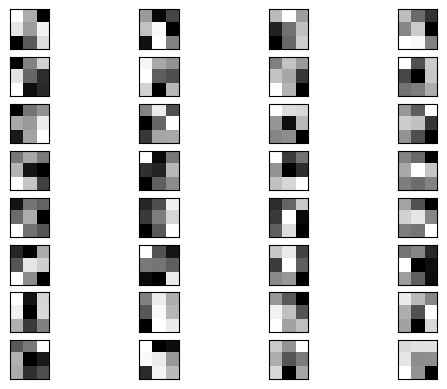

In [49]:
n_kernels, ix = 32, 1
for i in range(n_kernels):
    f = kernels[:, :, :, i]
    for j in range(1):
        ax = plt.subplot(8, 4, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(f[:, :, j], cmap='gray')
        ix += 1
plt.savefig('filter.jpeg', dpi=300)

In [50]:
model = tf.keras.models.Model(inputs=predict_model.inputs, outputs=predict_model.layers[1].output)

model.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d1 (Conv2D)                │ (None, 28, 28, 32)     │           320 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 320 (1.25 KB)

 Trainable params: 320 (1.25 KB)

 Non-trainable params: 0 (0.00 B)

In [51]:
img = x_train[10:11]

In [52]:
feature_maps = model(img)

feature_maps.shape

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 28, 28, 1))



TensorShape([1, 28, 28, 32])

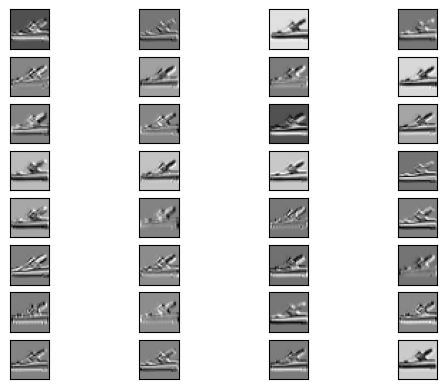

In [53]:
ix = 1
for _ in range(8):
    for _ in range(4):
        ax = plt.subplot(8, 4, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
plt.savefig('feature_map1.jpeg', dpi=300)

In [54]:
model = tf.keras.models.Model(inputs=predict_model.inputs, outputs=predict_model.layers[3].output)

model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d1 (Conv2D)                │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm1                     │ (None, 28, 28, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1 (Activation)              │ (None, 28, 28, 32)     │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 448 (1.75 KB)

 Trainable params: 384 (1.50 KB)

 Non-trainable params: 64 (256.00 B)

In [55]:
feature_maps = model(img)

feature_maps.shape

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 28, 28, 1))



TensorShape([1, 28, 28, 32])

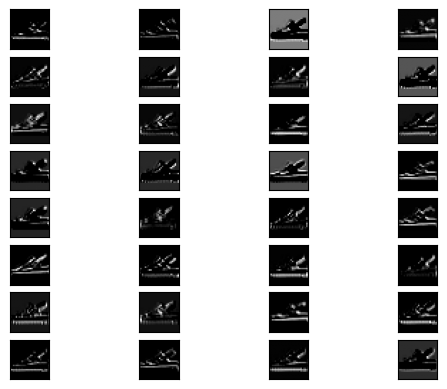

In [56]:
ix = 1
for _ in range(8):
    for _ in range(4):
        ax = plt.subplot(8, 4, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
plt.savefig('feature_map2.jpeg', dpi=300)

In [57]:
model = tf.keras.models.Model(inputs=predict_model.inputs, outputs=predict_model.layers[5].output)

model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d1 (Conv2D)                │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm1                     │ (None, 28, 28, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1 (Activation)              │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout1 (Dropout)              │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d2 (Conv2D)                │ (None, 28, 28, 32)     │         9,248 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,696 (37.88 KB)

 Trainable params: 9,632 (37.62 KB)

 Non-trainable params: 64 (256.00 B)

In [58]:
feature_maps = model(img)

feature_maps.shape

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 28, 28, 1))



TensorShape([1, 28, 28, 32])

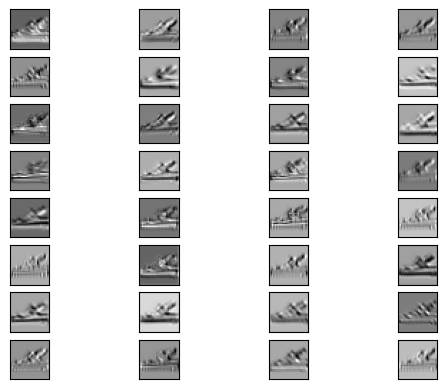

In [59]:
ix = 1
for _ in range(8):
    for _ in range(4):
        ax = plt.subplot(8, 4, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
plt.savefig('feature_map3.jpeg', dpi=300)

In [60]:
model = tf.keras.models.Model(inputs=predict_model.inputs, outputs=predict_model.layers[17].output)

model.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d1 (Conv2D)                │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm1                     │ (None, 28, 28, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1 (Activation)              │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout1 (Dropout)              │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d2 (Conv2D)                │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm2                     │ (None, 28, 28, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu2 (Activation)              │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool2d1 (MaxPooling2D)       │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout2 (Dropout)              │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d3 (Conv2D)                │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm3                     │ (None, 14, 14, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu3 (Activation)              │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout3 (Dropout)              │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d4 (Conv2D)                │ (None, 14, 14, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm4                     │ (None, 14, 14, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu4 (Activation)              │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool2d2 (MaxPooling2D)       │ (None, 7, 7, 64)       │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 65,760 (256.88 KB)

 Trainable params: 65,376 (255.38 KB)

 Non-trainable params: 384 (1.50 KB)

In [61]:
feature_maps = model(img)

feature_maps.shape

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 28, 28, 1))



TensorShape([1, 7, 7, 64])

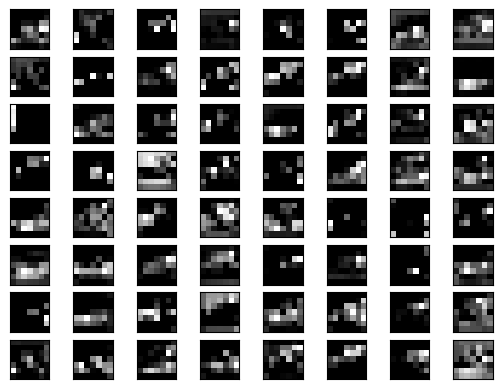

In [62]:
ix = 1
for _ in range(8):
    for _ in range(8):
        ax = plt.subplot(8, 8, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
plt.savefig('feature_map4.jpeg', dpi=300)

In [63]:
!pip install tf-keras-vis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 2.1 MB/s eta 0:00:00


In [64]:
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

In [65]:
test_data[6:7].shape

(1, 28, 28, 1)

In [66]:
img_array = (test_data[6:7].squeeze() * 255).astype('uint8')
img_array.shape

(28, 28)

In [67]:
image = Image.fromarray(img_array)
image

In [68]:
y_test[6:7]

array([[0., 0., 0., 0., 1., 0., 0., 0., 0., 0.]])

In [71]:
0: T-shirt/top
1: Trouser
2: Pullover
3: Dress
4: Coat
5: Sandal
6: Shirt
7: Sneaker
8: Bag
9: Ankle boot

SyntaxError: illegal target for annotation (ipython-input-3687308253.py, line 1)

In [70]:
pred = predict_model.predict(test_data[6:7])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


In [72]:
target_class = int(np.argmax(pred[0]))
target_class

4

In [73]:
score = CategoricalScore([target_class])

In [74]:
for layer in reversed(predict_model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer_name = layer.name
        break

In [75]:
print(f"Last convolutional layer name: {last_conv_layer_name}")

Last convolutional layer name: conv2d4


In [76]:
gradcam = Gradcam(predict_model, model_modifier=None, clone=True)

In [77]:
heatmap = gradcam(score, test_data[6:7], penultimate_layer=last_conv_layer_name)


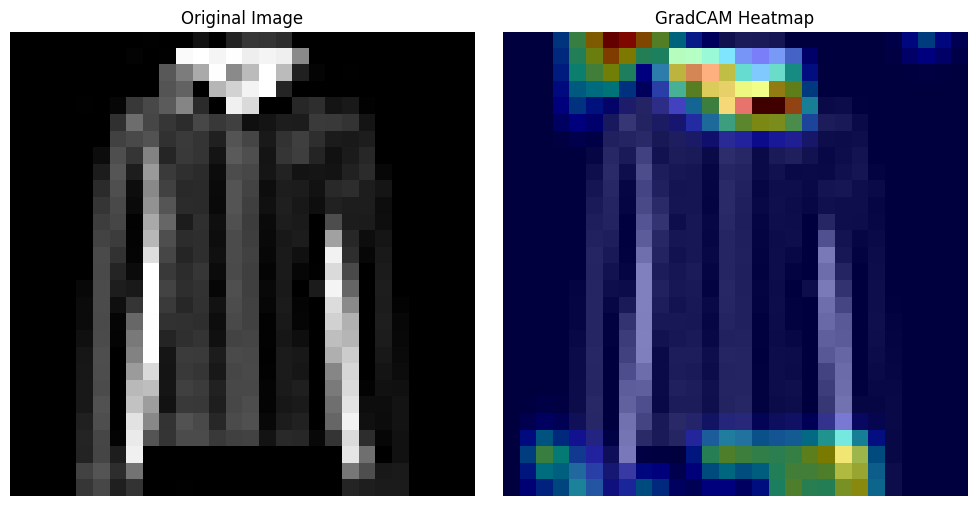

In [78]:
heatmap = heatmap[0]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display original image
axes[0].imshow(image.convert('RGB'))
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display GradCAM heatmap
axes[1].imshow(image.convert('RGB'))
axes[1].imshow(heatmap, cmap='jet', alpha=0.5) # Overlay the heatmap
axes[1].set_title('GradCAM Heatmap')
axes[1].axis('off')

plt.tight_layout()
plt.show()